# 데이터 확인

In [228]:
import os
import librosa
import IPython
import matplotlib.pyplot as plt
import numpy as np
import librosa.display

In [38]:
sample_audio = "data/genres/pop/pop.00000.wav"
sample_wave, sr = librosa.load(sample_audio)
IPython.display.Audio(data=sample_wave, rate=sr)

Wav length: 30.00018140589569, Mel_S shape:(128, 3007)


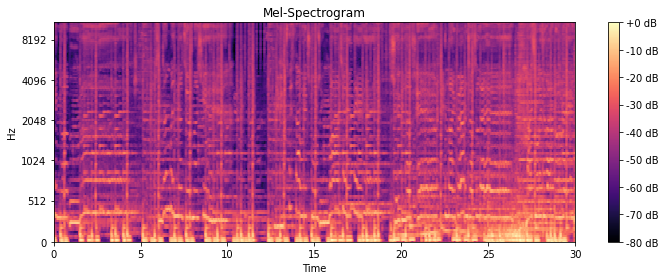

In [44]:
frame_length = 0.25
frame_stride = 0.010

input_nfft = int(round(sr*frame_length))
input_stride = int(round(sr*frame_stride))

S = librosa.feature.melspectrogram(sample_wave, n_mels=128, n_fft=input_nfft, hop_length=input_stride)
print("Wav length: {}, Mel_S shape:{}".format(len(sample_wave)/sr,np.shape(S)))

plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), y_axis='mel', sr=sr, hop_length=input_stride, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram')
plt.tight_layout()
plt.savefig('Mel-Spectrogram example.png')
plt.show()

___

In [326]:
class Get_Mfcc:
    def __init__(self, audio_dir, frame_length=0.25, frame_stride=0.01):
        self.frame_length = frame_length
        self.frame_stride = frame_stride
        self.input_nfft = int(round(sr*frame_length))
        self.input_stride = int(round(sr*frame_stride))
        self.sample_wave, self.sr = librosa.load(sample_audio)
        
        self.init_mfcc =  librosa.feature.melspectrogram(self.sample_wave, 
                                                        n_mels=128, 
                                                        n_fft=self.input_nfft, 
                                                        hop_length=self.input_stride)
        self.init_wave = self.sample_wave.copy()
        
    def noising(self,noise_factor=np.random.uniform(0,0.2)):
        noise = np.random.randn(len(self.sample_wave))
        augmented_data = self.sample_wave + noise_factor * noise
        # Cast back to same data type
        self.sample_wave = augmented_data
        return augmented_data
    
    def shifting(self, shift_max=10, shift_direction='both'):
        shift = np.random.randint(self.sr * shift_max+1)
        if shift_direction == 'right':
            shift = -shift
        elif shift_direction == 'both':
            direction = np.random.randint(0, 2)
            if direction == 1:
                shift = -shift
        augmented_data = np.roll(self.sample_wave, shift)
        # Set to silence for heading/ tailing
        if shift > 0:
            augmented_data[:shift] = 0
        else:
            augmented_data[shift:] = 0
        self.sample_wave = augmented_data
        return augmented_data
    
    def time_mask(self,mask_ratio=0.1):
        start_point = np.random.randint(0,len(self.sample_wave)-int(mask_ratio*len(self.sample_wave)))
        end_point = start_point+int(mask_ratio*len(self.sample_wave))
        
        augmented_data = np.hstack((self.sample_wave[:start_point],
                                       np.zeros(end_point-start_point),
                                       self.sample_wave[end_point:]))
        self.sample_wave=augmented_data
        return augmented_data
    
    def change_pitch(self, pitch_factor=np.random.randint(-5,5)):
        augmented_data = librosa.effects.pitch_shift(self.sample_wave, self.sr, pitch_factor)
        self.sample_wave = augmented_data
        return augmented_data
    
    def get_audio(self):
        return IPython.display.Audio(data=self.sample_wave, rate=self.sr)
    
    def plot_mfcc(self):
        self.sample_mfcc = self.get_mfcc()
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(librosa.power_to_db(self.sample_mfcc, ref=np.max), 
                                 y_axis='mel', sr=self.sr, hop_length=self.input_stride, x_axis='time')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Mel-Spectrogram')
        plt.tight_layout()
        plt.show()
        
    def get_mfcc(self):
        self.mfcc = librosa.feature.melspectrogram(self.sample_wave,
                                                   n_mels=128,
                                                   n_fft=self.input_nfft,
                                                   hop_length=self.input_stride)
        return self.mfcc
    
    def get_random_aug_mfcc(self):
        self.noising()
        self.shifting()
        self.time_mask()
        self.change_pitch()
        self.mfcc = librosa.feature.melspectrogram(self.sample_wave,
                                                   n_mels=128,
                                                   n_fft=self.input_nfft,
                                                   hop_length=self.input_stride)
        return self.mfcc

/home/tactics/anaconda3/lib/python3.7/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/tactics/anaconda3/lib/python3.7/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


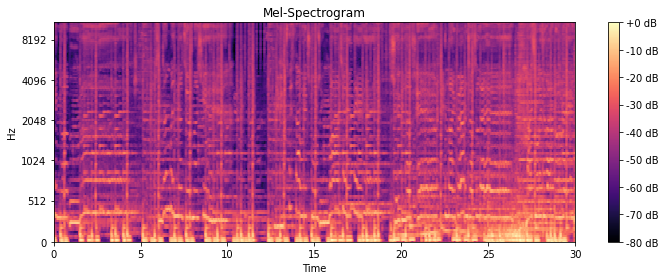

array([[6.1143564e+03, 6.0862432e+03, 6.0051758e+03, ..., 5.1810303e+01,
        5.8106606e+01, 6.2020786e+01],
       [1.9724435e+03, 1.9959084e+03, 2.0616235e+03, ..., 6.0966793e+01,
        6.9087273e+01, 7.4154465e+01],
       [1.3024443e+03, 1.2958116e+03, 1.2770581e+03, ..., 2.6811932e+01,
        2.9312716e+01, 3.0831964e+01],
       ...,
       [5.1119387e-01, 5.2845120e-01, 5.7751316e-01, ..., 1.7051830e+00,
        1.5430470e+00, 1.4517761e+00],
       [2.3407307e-01, 2.4372616e-01, 2.7227372e-01, ..., 1.5316510e+00,
        1.3681630e+00, 1.2787366e+00],
       [2.2805111e-01, 2.3027647e-01, 2.3710813e-01, ..., 8.2198894e-01,
        8.1775922e-01, 8.1945783e-01]], dtype=float32)

In [327]:
sample_wave, sr = librosa.load(sample_audio)
get_melspectrogram(sample_wave,plot=True)

# 데이터 증강

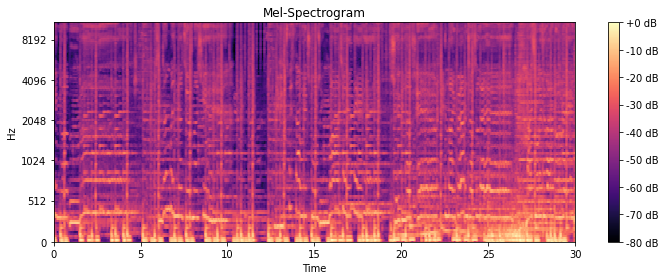

In [328]:
data = Get_Mfcc('data/genres/pop/pop.00000.wav')
data.plot_mfcc()
data.get_audio()

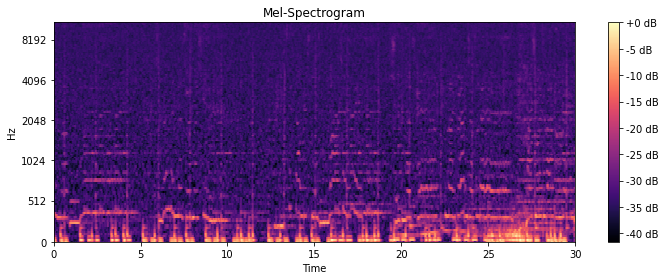

In [329]:
data = Get_Mfcc('data/genres/pop/pop.00000.wav')
data.noising()
data.plot_mfcc()
data.get_audio()

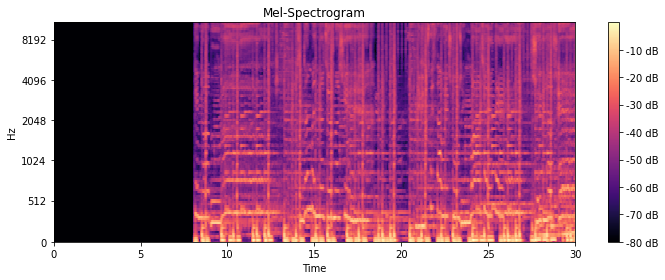

In [330]:
data = Get_Mfcc('data/genres/pop/pop.00000.wav')
data.shifting()
data.plot_mfcc()
data.get_audio()

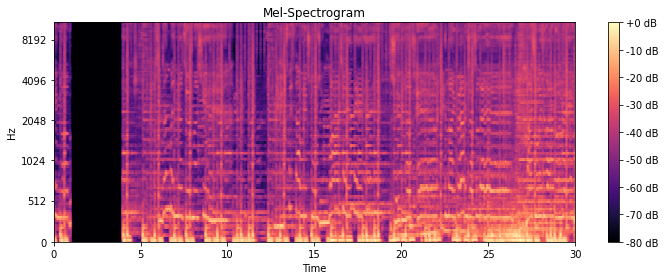

In [331]:
data = Get_Mfcc('data/genres/pop/pop.00000.wav')
data.time_mask()
data.plot_mfcc()
data.get_audio()

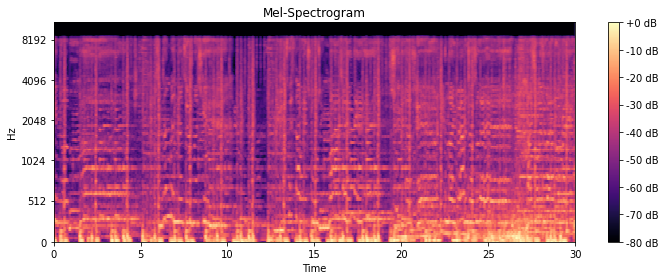

In [332]:
data = Get_Mfcc('data/genres/pop/pop.00000.wav')
data.change_pitch()
data.plot_mfcc()
data.get_audio()

# Dataset

In [333]:
import torch
from torch import nn
from torch.utils.data import Dataset,DataLoader

In [335]:
class CustomDataset(Dataset):
    def __init__(self):
        root = 'data/genres/'
        self.all_waves=[root+genre+'/'+wav for genre in os.listdir(root) for wav in os.listdir(root+genre)]
        self.all_genres = os.listdir(root)
        self.label_num = len(self.all_genres)
    def __len__(self):
        return len(self.all_waves)
    def __getitem__(self,idx):
        wave = self.all_waves[idx]
        genre = wave.split('/')[2]
        genre_index = self.all_genres.index(genre)
        X = torch.from_numpy(Get_Mfcc(wave).get_random_aug_mfcc())
        y = torch.zeros(self.label_num)
        y[genre_index]=1
        
        return X,y

In [336]:
dset = CustomDataset()
dset[0]

(tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 5.3832e+01, 5.0701e+01,
          4.9102e+01],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 8.7693e+01, 7.2019e+01,
          6.3280e+01],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 4.4774e+01, 4.3189e+01,
          4.2284e+01],
         ...,
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 7.4353e-07, 8.6489e-07,
          9.4130e-07],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.1421e-06, 1.3286e-06,
          1.4459e-06],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.3976e-06, 1.6257e-06,
          1.7694e-06]]),
 tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))